# Q 1.5 

In [1]:
import numpy as np

In [2]:
A = np.array([
    [0, 1, 1, 0, 0],
    [1, 0, 1, 0, 0],
    [1, 1, 0, 0, 0],
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0]
])

# Compute the degree matrix D
D = np.diag(np.sum(A, axis=1))

L = D - A

# Perform eigenvalue decomposition on the Laplacian matrix
eigenvalues, eigenvectors = np.linalg.eig(L)

# Find indices of eigenvalues that are approximately zero
zero_eigen_indices = [index for index, value in enumerate(np.around(eigenvalues, 1)) if value == 0]

print("Eigenvalues:", np.around(eigenvalues, 1))
print("Indices of zero eigenvalues:", zero_eigen_indices)
print("Eigenvectors:\n", eigenvectors)
print("Cluster Assignments:\n", eigenvectors[:, zero_eigen_indices])

Eigenvalues: [ 3. -0.  3.  2.  0.]
Indices of zero eigenvalues: [1, 4]
Eigenvectors:
 [[ 0.81649658 -0.57735027  0.30959441  0.          0.        ]
 [-0.40824829 -0.57735027 -0.80910101  0.          0.        ]
 [-0.40824829 -0.57735027  0.49950661  0.          0.        ]
 [ 0.          0.          0.          0.70710678  0.70710678]
 [ 0.          0.          0.         -0.70710678  0.70710678]]
Cluster Assignments:
 [[-0.57735027  0.        ]
 [-0.57735027  0.        ]
 [-0.57735027  0.        ]
 [ 0.          0.70710678]
 [ 0.          0.70710678]]


# Q 3

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
import time

In [2]:
# Function to initialize centroids
def initialize_centroids(pixels, k):
    indices = np.random.choice(pixels.shape[0], k, replace=False)
    return pixels[indices]

# Function to assign clusters using L2 norm
def assign_clusters_l2(pixels, centroids):
    distances = np.linalg.norm(pixels[:, np.newaxis] - centroids, axis=2)
    return np.argmin(distances, axis=1)

# Function to assign clusters using L1 norm
def assign_clusters_l1(pixels, centroids):
    distances = np.sum(np.abs(pixels[:, np.newaxis] - centroids), axis=2)
    return np.argmin(distances, axis=1)

# Function to update centroids
def update_centroids(pixels, labels, k):
    new_centroids = np.array([pixels[labels == i].mean(axis=0) for i in range(k)])
    return new_centroids

# Function to check for convergence
def has_converged(old_centroids, new_centroids):
    return np.allclose(old_centroids, new_centroids)

In [3]:
# K-means clustering algorithm
def kmeans(pixels, k, norm='l2', max_iters=100):
    # Initialize the centroids
    centroids = initialize_centroids(pixels, k)
    for i in range(max_iters):
        # Assign clusters based on the specified norm (L2 or L1)
        if norm == 'l2':
            labels = assign_clusters_l2(pixels, centroids)
        elif norm == 'l1':
            labels = assign_clusters_l1(pixels, centroids)
        # Update the centroids based on the mean of the assigned clusters
        new_centroids = update_centroids(pixels, labels, k)
        # Check for convergence (if the centroids have stopped changing)
        if has_converged(centroids, new_centroids):
            break
        # Update centroids for the next iteration
        centroids = new_centroids
    return labels, centroids, i + 1  # Return the number of iterations

In [4]:
# Function to compress image using K-means
def compress_image(image, k, norm='l2'):
    # Reshape the image into a 2D array of pixels
    pixels = image.reshape(-1, 3)
    # Apply the K-means clustering algorithm to the pixels
    labels, centroids, iterations = kmeans(pixels, k, norm)
    # Reconstruct the compressed image using the centroids
    compressed_image = centroids[labels].reshape(image.shape)
    return compressed_image.astype(np.uint8), labels, centroids, iterations

In [5]:
# Function to display images
def display_images(image, compressed_images_l2, compressed_images_l1, k_values):
    fig, axes = plt.subplots(len(k_values), 3, figsize=(15, 5 * len(k_values)))
    for i, k in enumerate(k_values):
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f'Original Image\nk={k}')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(compressed_images_l2[k])
        axes[i, 1].set_title(f'Compressed Image (L2)\nk={k}')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(compressed_images_l1[k])
        axes[i, 2].set_title(f'Compressed Image (L1)\nk={k}')
        axes[i, 2].axis('off')
    plt.tight_layout()
    plt.show()

In [6]:
# Function to run K-means and collect results
def run_kmeans_on_image(image_path, k_values, image_shape=(320, 240)):
    image = imread(image_path)
    image = resize(image, image_shape, anti_aliasing=True)
    image = (image * 255).astype(np.uint8)  # Ensure the image is in the range [0, 255]
    compressed_images_l2 = {}
    compressed_images_l1 = {}
    results_l2 = []
    results_l1 = []
    
    for k in k_values:
        # Run K-means with L2 norm
        start_time = time.time()
        compressed_image_l2, labels_l2, centroids_l2, iterations_l2 = compress_image(image, k, norm='l2')
        run_time_l2 = time.time() - start_time
        
        compressed_images_l2[k] = compressed_image_l2
        results_l2.append((k, iterations_l2, run_time_l2, labels_l2, centroids_l2))
        
        # Run K-means with L1 norm
        start_time = time.time()
        compressed_image_l1, labels_l1, centroids_l1, iterations_l1 = compress_image(image, k, norm='l1')
        run_time_l1 = time.time() - start_time
        
        compressed_images_l1[k] = compressed_image_l1
        results_l1.append((k, iterations_l1, run_time_l1, labels_l1, centroids_l1))
    
    return image, compressed_images_l2, compressed_images_l1, results_l2, results_l1


In [7]:

# Define k values
k_values = [2, 5, 10, 20, 30]

# Run K-means on the example images
image_paths = [
    'Glockenbronze.png',
    'football.bmp', 
    'hawaii.png'
               ]


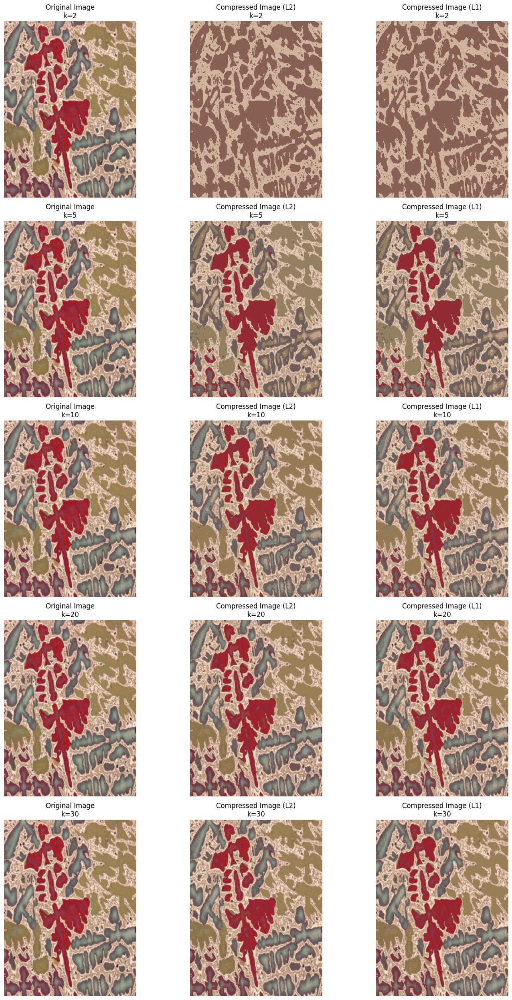

Results for Glockenbronze.png:
k     Iterations (L2) Run Time (L2) (s)    Iterations (L1) Run Time (L1) (s)   
2     12              0.21                 7               0.17                
5     28              1.41                 29              1.08                
10    71              3.04                 28              1.13                
20    100             8.89                 100             16.26               
30    100             10.22                100             9.28                

Cluster Assignments for k=2 (L2 norm):
[0 0 0 ... 1 1 1]

Centroids for k=2 (L2 norm):
[[207.25931667 179.44814932 157.69958874]
 [136.34067272  96.61285683  85.35720292]]

Cluster Assignments for k=2 (L1 norm):
[0 0 0 ... 1 1 1]

Centroids for k=2 (L1 norm):
[[207.45750929 179.54969684 157.79464144]
 [136.3734961   96.74156162  85.46517583]]

Cluster Assignments for k=5 (L2 norm):
[3 4 4 ... 0 0 0]

Centroids for k=5 (L2 norm):
[[110.27430676  95.62728473  93.41865314]
 [149.5640636

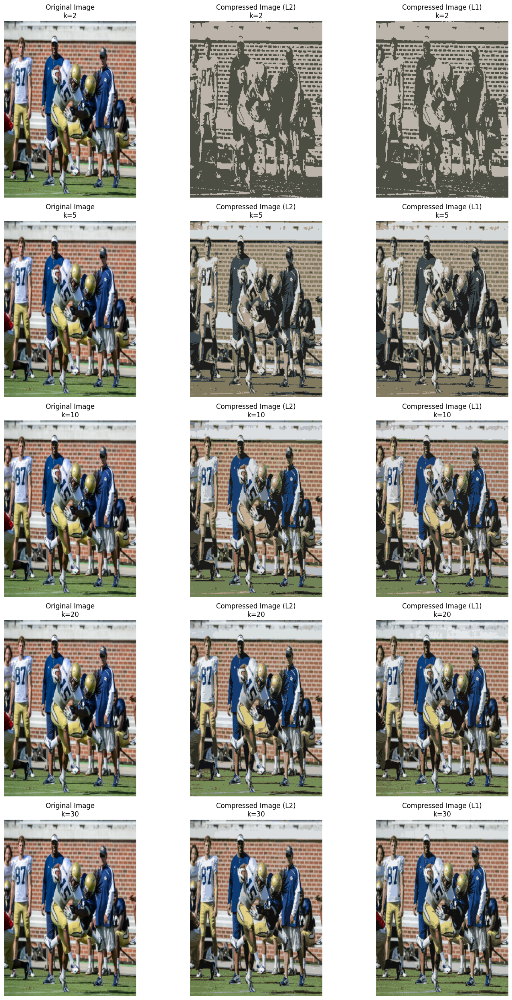

Results for football.bmp:
k     Iterations (L2) Run Time (L2) (s)    Iterations (L1) Run Time (L1) (s)   
2     20              0.45                 15              0.33                
5     41              0.87                 21              0.69                
10    100             3.53                 46              1.51                
20    100             6.41                 54              3.20                
30    100             8.76                 100             8.61                

Cluster Assignments for k=2 (L2 norm):
[1 1 1 ... 1 1 1]

Centroids for k=2 (L2 norm):
[[188.45300526 180.4567343  170.73523798]
 [ 76.43129869  78.35079428  68.35474815]]

Cluster Assignments for k=2 (L1 norm):
[1 1 1 ... 1 1 1]

Centroids for k=2 (L1 norm):
[[188.69450295 181.08288588 171.50342638]
 [ 77.14706087  78.68557239  68.58063169]]

Cluster Assignments for k=5 (L2 norm):
[2 2 2 ... 0 0 0]

Centroids for k=5 (L2 norm):
[[130.9822677  122.61507477  95.48409649]
 [211.65516967 216

/var/folders/5m/thz32d2s4x50mxyp7fxy_3sw0000gn/T/ipykernel_28134/3409311649.py:18: RuntimeWarning: Mean of empty slice.
  new_centroids = np.array([pixels[labels == i].mean(axis=0) for i in range(k)])


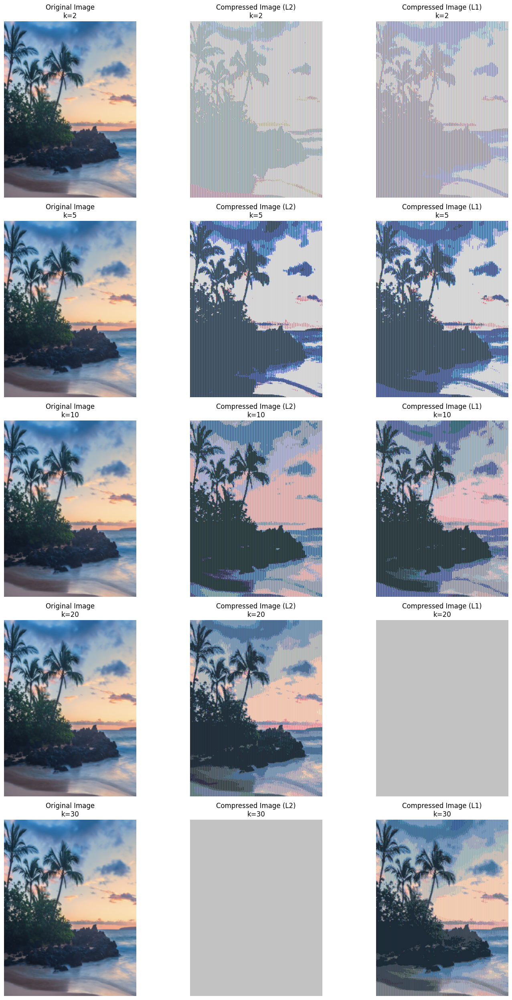

Results for hawaii.png:
k     Iterations (L2) Run Time (L2) (s)    Iterations (L1) Run Time (L1) (s)   
2     16              0.23                 9               0.11                
5     21              0.51                 17              0.47                
10    23              1.15                 49              2.13                
20    36              3.19                 100             6.98                
30    100             10.42                66              7.54                

Cluster Assignments for k=2 (L2 norm):
[1 1 1 ... 0 1 1]

Centroids for k=2 (L2 norm):
[[136.0555875  125.20680013  71.07625967]
 [169.04941063 175.51623113 207.86676749]]

Cluster Assignments for k=2 (L1 norm):
[1 1 1 ... 0 1 0]

Centroids for k=2 (L1 norm):
[[135.82930643  72.80658637 134.40148535]
 [170.63274603 212.59586445 171.63598354]]

Cluster Assignments for k=5 (L2 norm):
[2 4 3 ... 4 0 2]

Centroids for k=5 (L2 norm):
[[104.39405132 254.98691032  64.43027475]
 [ 50.89960756  64.0

In [9]:
for image_path in image_paths:
    image, compressed_images_l2, compressed_images_l1, results_l2, results_l1 = run_kmeans_on_image(image_path, k_values)
    
    # Display the original and compressed images
    display_images(image, compressed_images_l2, compressed_images_l1, k_values)
    
    # Print the results in a formatted way
    print(f"Results for {image_path.split('/')[-1]}:")
    print(f"{'k':<5} {'Iterations (L2)':<15} {'Run Time (L2) (s)':<20} {'Iterations (L1)':<15} {'Run Time (L1) (s)':<20}")
    for ((k_l2, iters_l2, time_l2, labels_l2, centroids_l2), 
         (k_l1, iters_l1, time_l1, labels_l1, centroids_l1)) in zip(results_l2, results_l1):
        print(f"{k_l2:<5} {iters_l2:<15} {time_l2:<20.2f} {iters_l1:<15} {time_l1:<20.2f}")
    
    # Output cluster assignments and centroids
    for (k, _, _, labels_l2, centroids_l2), (_, _, _, labels_l1, centroids_l1) in zip(results_l2, results_l1):
        print(f"\nCluster Assignments for k={k} (L2 norm):")
        print(labels_l2)
        print(f"\nCentroids for k={k} (L2 norm):")
        print(centroids_l2)
        
        print(f"\nCluster Assignments for k={k} (L1 norm):")
        print(labels_l1)
        print(f"\nCentroids for k={k} (L1 norm):")
        print(centroids_l1)
    print("\n" + "="*80 + "\n")

## Elbow Method

I did it one image at a time 

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from sklearn.cluster import KMeans

In [12]:
# get the image
def load_image(image_path, target_size=(320, 240)):
    image = imread(image_path)
    image = resize(image, target_size, anti_aliasing=True)
    image = (image * 255).astype(np.uint8)  
    return image

# change picture to pixels
def image_to_pixels(image):
    pixels = image.reshape(-1, 3)
    return pixels

In [13]:
image_path = 'Glockenbronze.png'
image = load_image(image_path)
pixels = image_to_pixels(image)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.1

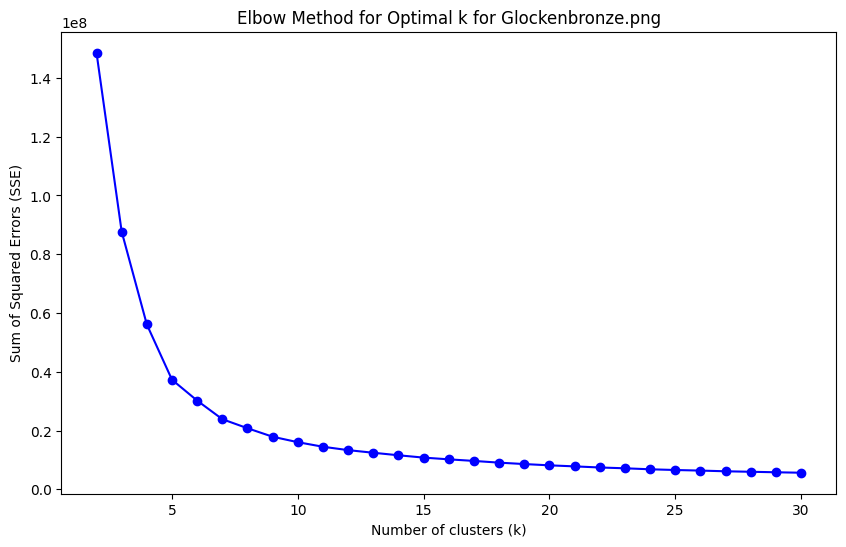

In [14]:
# use elbow to find the best k
def find_best_k_elbow_method(pixels, max_k=30):
    sse = []
    k_values = range(2, max_k + 1)
    
    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        sse.append(kmeans.inertia_)
    
    plt.figure(figsize=(10, 6))
    plt.plot(k_values, sse, 'bo-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.title('Elbow Method for Optimal k for Glockenbronze.png')
    plt.show()

find_best_k_elbow_method(pixels)

In [15]:
image_path = 'football.bmp'
image = load_image(image_path)
pixels = image_to_pixels(image)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.1

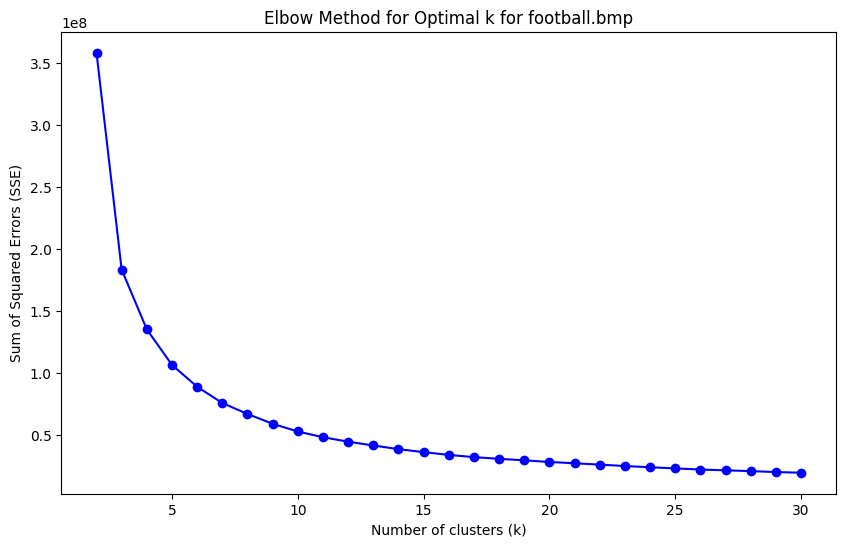

In [16]:
# use elbow to find the best k
def find_best_k_elbow_method(pixels, max_k=30):
    sse = []
    k_values = range(2, max_k + 1)
    
    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        sse.append(kmeans.inertia_)
    
    plt.figure(figsize=(10, 6))
    plt.plot(k_values, sse, 'bo-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.title('Elbow Method for Optimal k for football.bmp')
    plt.show()

find_best_k_elbow_method(pixels)

In [17]:
image_path = 'hawaii.png'
image = load_image(image_path)
pixels = image_to_pixels(image)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.1

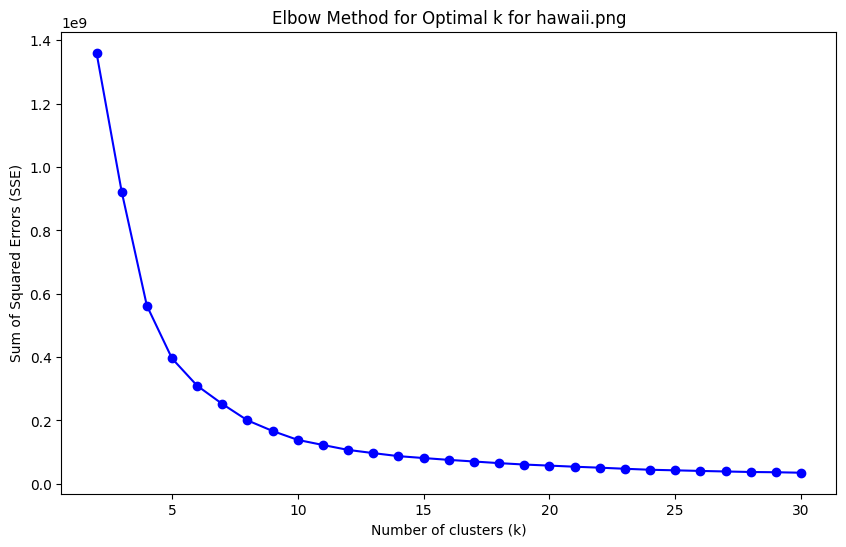

In [18]:
# use elbow to find the best k
def find_best_k_elbow_method(pixels, max_k=30):
    sse = []
    k_values = range(2, max_k + 1)
    
    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
        sse.append(kmeans.inertia_)
    
    plt.figure(figsize=(10, 6))
    plt.plot(k_values, sse, 'bo-')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.title('Elbow Method for Optimal k for hawaii.png')
    plt.show()

find_best_k_elbow_method(pixels)

# Q 4.1 & 4.2

In [19]:
import numpy as np
from scipy.io import loadmat
import pandas as pd

In [20]:
# Load the MNIST dataset 
mnist = loadmat('mnist_10digits.mat')

# Extract features and labels
X_train = mnist['xtrain']
y_train = mnist['ytrain'].flatten()
X_test = mnist['xtest']
y_test = mnist['ytest'].flatten()

# Normalize the features
X_train = X_train / 255.0
X_test = X_test / 255.0

In [21]:
# Function to initialize centroids
def initialize_centroids(pixels, k):
    indices = np.random.choice(pixels.shape[0], k, replace=False)
    return pixels[indices]

# Function to assign clusters using L2 norm
def assign_clusters_l2(pixels, centroids):
    distances = np.linalg.norm(pixels[:, np.newaxis] - centroids, axis=2)
    return np.argmin(distances, axis=1)

# Function to assign clusters using L1 norm
def assign_clusters_l1(pixels, centroids):
    distances = np.sum(np.abs(pixels[:, np.newaxis] - centroids), axis=2)
    return np.argmin(distances, axis=1)

# Function to update centroids for L2 norm
def update_centroids_l2(pixels, labels, k):
    new_centroids = np.array([pixels[labels == i].mean(axis=0) for i in range(k)])
    return new_centroids

# Function to update centroids for L1 norm (median)
def update_centroids_l1(pixels, labels, k):
    new_centroids = np.array([np.median(pixels[labels == i], axis=0) for i in range(k)])
    return new_centroids

# Function to check for convergence
def has_converged(old_centroids, new_centroids):
    return np.allclose(old_centroids, new_centroids)

In [22]:
# K-means clustering algorithm
def kmeans(pixels, k, norm='l2', max_iters=100):
    centroids = initialize_centroids(pixels, k)
    for i in range(max_iters):
        if norm == 'l2':
            labels = assign_clusters_l2(pixels, centroids)
            new_centroids = update_centroids_l2(pixels, labels, k)
        elif norm == 'l1':
            labels = assign_clusters_l1(pixels, centroids)
            new_centroids = update_centroids_l1(pixels, labels, k)
        if has_converged(centroids, new_centroids):
            break
        centroids = new_centroids
    return labels, centroids, i + 1  # Return the number of iterations

the following code takes about 20 minutes to run.

In [23]:
# Apply K-means clustering with K=10 using L2 norm
k = 10
labels_l2, centroids_l2, n_iters_l2 = kmeans(X_train, k, norm='l2')

# Apply K-means clustering with K=10 using L1 norm
labels_l1, centroids_l1, n_iters_l1 = kmeans(X_train, k, norm='l1')

In [24]:
# Calculate the purity score for each cluster
def purity_score(y_true, y_pred, n_clusters):
    # Create a contingency matrix to count the occurrences of true labels in each cluster
    contingency_matrix = np.zeros((n_clusters, 10), dtype=int)
    # Populate the contingency matrix
    for i in range(len(y_true)):
        contingency_matrix[y_pred[i], y_true[i]] += 1
    # Calculate purity scores for each cluster
    purity_scores = np.amax(contingency_matrix, axis=1) / np.sum(contingency_matrix, axis=1)
    return purity_scores

purity_scores_l2 = purity_score(y_train, labels_l2, k)
purity_scores_l1 = purity_score(y_train, labels_l1, k)

In [25]:
# Create DataFrames for better visualization
df_l2 = pd.DataFrame({
    'Cluster': np.arange(1, k + 1),
    'Purity Score (L2)': purity_scores_l2
})

df_l1 = pd.DataFrame({
    'Cluster': np.arange(1, k + 1),
    'Purity Score (L1)': purity_scores_l1
})

print("Purity Scores using L2 norm:")
print(df_l2.to_string(index=False))

print("\nPurity Scores using L1 norm:")
print(df_l1.to_string(index=False))

Purity Scores using L2 norm:
 Cluster  Purity Score (L2)
       1           0.937500
       2           0.615590
       3           0.570645
       4           0.430472
       5           0.365250
       6           0.866035
       7           0.496952
       8           0.916046
       9           0.887995
      10           0.417644

Purity Scores using L1 norm:
 Cluster  Purity Score (L1)
       1           0.823962
       2           0.549538
       3           0.756340
       4           0.409832
       5           0.489652
       6           0.506555
       7           0.444700
       8           0.842473
       9           0.809467
      10           0.926447


# Q 5

In [26]:
import csv
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from collections import defaultdict
from statistics import mode, mean
from tabulate import tabulate


In [27]:
# Function to load nodes from a file
def load_nodes(file_path):
    with open(file_path) as f:
        reader = csv.reader(f, delimiter="\t")
        nodes = list(reader)  # Schema = ["Node", "Site", "Orientation", "Tags"]
    return nodes

# Function to load edges from a file
def load_edges(file_path):
    with open(file_path) as f:
        reader = csv.reader(f, delimiter="\t")
        edges = list(reader)  # Schema = Start, End
    return np.array(edges).astype(int)

# Function to preprocess nodes by converting certain fields to integers
def preprocess_nodes(nodes0):
    nodes = nodes0.copy()
    for i in range(len(nodes0)):
        # Convert Node to int
        nodes[i][0] = int(nodes0[i][0])
        # Convert Orientation to int
        nodes[i][2] = int(nodes0[i][2])
    return np.array(nodes)

In [28]:
# Function to create the adjacency matrix from edges
def create_adjacency_matrix(n, edges):
    # Initialize an n x n matrix with zeros
    A = np.zeros(shape=(n, n), dtype='object')
    for edge in edges:
        # Adjust for zero-based indexing
        i = (edge - 1)[0]
        # Adjust for zero-based indexing
        j = (edge - 1)[1]
        # Set the corresponding element to 1 (indicating an edge)
        A[i, j] = 1
        # Ensure the matrix is symmetric
        A[j, i] = 1
    return A

# Function to create the degree matrix from the adjacency matrix
def create_degree_matrix(A):
    # Calculate the degree of each node (sum of connections)
    d_i = A.sum(axis=0)
    return np.diagflat(d_i), d_i

# Function to remove isolated nodes (nodes with no edges) from the matrices and nodes list
def remove_isolated_nodes(A, D, nodes, d_i):
    # Identify indices of isolated nodes
    del_list = [i for i in range(len(d_i)) if d_i[i] == 0]
    # Remove isolated nodes from adjacency matrix (rows)
    A = np.delete(A, del_list, 0)
    # Remove isolated nodes from adjacency matrix (columns)
    A = np.delete(A, del_list, 1)
    # Remove isolated nodes from degree matrix (rows)
    D = np.delete(D, del_list, 0)
    # Remove isolated nodes from degree matrix (columns)
    D = np.delete(D, del_list, 1)
    nodes = np.delete(nodes, del_list, 0)
    return A, D, nodes

# Function to calculate the Laplacian matrix from the degree matrix and adjacency matrix
def calculate_laplacian(D, A):
    # Compute the Laplacian matrix and convert to float type
    return (D - A).astype(float)

# Function to perform spectral clustering
def run_spec(L, k):
    # Compute the eigenvalues and eigenvectors of the Laplacian matrix
    v, x = np.linalg.eig(L)
    # Sort the eigenvalues in ascending order
    idx = np.argsort(v)
    x = np.real(x[:, idx[-k:]])  # Select the k largest eigenvectors
    x = x / np.repeat(np.sqrt(np.sum(x * x, axis=1)).reshape(-1, 1), k, axis=1)  # Normalize
    kmeans = KMeans(n_clusters=k, n_init=10).fit(x)  # Explicitly set n_init to 10
    c_idx = kmeans.labels_
    return kmeans, c_idx

In [29]:
# Function to calculate majority, mismatch, and cluster groups
def calc_metrics(nodes, labels):
    num_nodes = nodes.shape[0]
    # Dictionary to group nodes by cluster
    cluster_groups = defaultdict(list)
    majority = {}
    mismatch = {}

    # Group nodes by their cluster labels
    for i in range(num_nodes):
        node = nodes[i]
        group = node[2].astype(int)
        cluster = labels[i]
        cluster_groups[cluster].append(group)

    # Determine the majority group in each cluster
    for key in cluster_groups.keys():
        majority[key] = mode(cluster_groups[key])

    # Calculate the mismatch rate for each cluster
    for key in cluster_groups.keys():
        value = cluster_groups[key]
        most_common = majority[key]
        total = len(value)
        count = sum(1 for x in value if x == most_common)
        mismatch[key] = float(format(1 - count / total, '.4f'))

    return majority, mismatch, cluster_groups

In [30]:
def main():
    nodes0 = load_nodes('nodes.txt')
    edges = load_edges('edges.txt')

    nodes = preprocess_nodes(nodes0)
    n = len(nodes)
    A = create_adjacency_matrix(n, edges)
    D, d_i = create_degree_matrix(A)
    A, D, nodes = remove_isolated_nodes(A, D, nodes, d_i)
    L = calculate_laplacian(D, A)

     # Adjust k values
    k_vals = [2, 5, 10, 30, 50]  
    results = []

    for k in k_vals:
        kmeans_obj, labels = run_spec(L, k)
        majority, mismatch, cluster_groups = calc_metrics(nodes, labels)

        avg = mean(mismatch.values())
        min_rate = min(mismatch.values())
        max_rate = max(mismatch.values())
        spread = max_rate - min_rate

        for cluster_idx, groups in cluster_groups.items():
            cluster_size = len(groups)
            voted_label = majority[cluster_idx]
            mismatch_rate = mismatch[cluster_idx]
            results.append({
                "k": k,
                "Cluster Index": cluster_idx + 1,
                "Cluster Size": cluster_size,
                "Voted Label": voted_label,
                "Cluster Mismatch Rate": mismatch_rate
            })

        results.append({
            "k": f"k={k}",
            "Cluster Index": "",
            "Cluster Size": "",
            "Voted Label": "",
            "Cluster Mismatch Rate": "",
            "Overall Mismatch Rate": avg
        })

    df = pd.DataFrame(results)
    table_string = tabulate(df, headers="keys", tablefmt="grid")

    # Save table to a file for convenience
    with open("clustering.txt", "w") as f:
        f.write(table_string)

    print(table_string)

if __name__ == "__main__":
    main()

+-----+------+-----------------+----------------+---------------+-------------------------+-------------------------+
|     | k    | Cluster Index   | Cluster Size   | Voted Label   | Cluster Mismatch Rate   |   Overall Mismatch Rate |
+=====+======+=================+================+===============+=========================+=========================+
|   0 | 2    | 2               | 784            | 1             | 0.449                   |               nan       |
+-----+------+-----------------+----------------+---------------+-------------------------+-------------------------+
|   1 | 2    | 1               | 440            | 0             | 0.4636                  |               nan       |
+-----+------+-----------------+----------------+---------------+-------------------------+-------------------------+
|   2 | k=2  |                 |                |               |                         |                 0.4563  |
+-----+------+-----------------+----------------+-------